In [1]:
# Importing libraries
import pandas as pd 
import numpy as np 
import scipy.stats as stats
import matplotlib.pyplot as plt 
import seaborn as sns


In [2]:
# loading indicators DataFrame
indicadores_df = pd.read_excel('../DataClean/indicadores.xlsx')


In [15]:
# Loading console sales DataFrame
console_df = pd.read_csv('../DataClean/Console_sales_chewed.csv', sep=';')

In [4]:
indicadores_df.head()

,Country Name,Year,Crecimiento del PIB (% anual),"Desempleo, mujeres (% de la población activa femenina) (estimación modelado OIT)","Desempleo, total (% de la población activa total) (estimación modelado OIT)","Desempleo, varones (% de la población activa masculina) (estimación modelado OIT)","INB per cápita, PPA (a $ internacionales actuales)","INB per cápita, método Atlas (US$ a precios actuales)","INB, PPA (a $ internacionales actuales)","INB, método Atlas (US$ a precios actuales)",...,"Población activa, total","Población de 65 años de edad y más, hombres","Población de 65 años de edad y más, mujeres","Población de 65 años de edad y más, total","Población entre 0 y 14 años de edad, hombres","Población entre 0 y 14 años de edad, mujeres","Población entre 0 y 14 años de edad, total","Población entre 15 y 64 años de edad, hombres","Población entre 15 y 64 años de edad, mujeres","Población entre 15 y 64 años de edad, total"
0,Estados Unidos,2000,4.127484,4.100,3.992,3.901,36800.0,35960.0,1.038386e+13,1.014760e+13,...,146729576,14414059,20387123,34801176,31330276,29907093,61237370,93239646,92884214,186123865
1,Estados Unidos,2001,0.998341,4.653,4.731,4.797,37700.0,36710.0,1.074371e+13,1.046220e+13,...,147698388,14620751,20469861,35090876,31396354,29953328,61349552,94410726,94117935,188528528
2,Estados Unidos,2002,1.741695,5.610,5.783,5.929,38430.0,37310.0,1.105432e+13,1.073268e+13,...,148526037,14818992,20534403,35353639,31501156,30039941,61540958,95474911,95255789,190730595
3,Estados Unidos,2003,2.861211,5.661,5.989,6.266,39740.0,39770.0,1.153027e+13,1.153645e+13,...,149140813,15016619,20601784,35618525,31584885,30115848,61700652,96471064,96317733,192788756
4,Estados Unidos,2004,3.798891,5.397,5.529,5.640,42060.0,43510.0,1.231399e+13,1.274051e+13,...,150211571,15239541,20724462,35964061,31622791,30158889,61781645,97587329,97472285,195059592


In [16]:
console_df.head()

,Year,Dato,Console,Company,Sales
0,2011,anual,Nintendo 3DS,Nintendo,12560000
1,2012,anual,Nintendo 3DS,Nintendo,13480000
2,2013,anual,Nintendo 3DS,Nintendo,14310000
3,2014,anual,Nintendo 3DS,Nintendo,9740000
4,2015,anual,Nintendo 3DS,Nintendo,7330000


In [17]:
# Grouping sales by year, despite the console or company values
console_df = console_df[['Year', 'Sales']].groupby('Year').agg({'Sales': 'sum'}).reset_index()
console_df.head()

,Year,Sales
0,2008,89230000
1,2009,81870000
2,2010,74530000
3,2011,69040000
4,2012,54310000


In [18]:
# obtaining an array of the unique years
years = console_df['Year'].unique()

In [19]:
# filtering the DataFrame by the years we have console sales data
indicadores_df = indicadores_df[indicadores_df['Year'].isin(years)]

In [20]:
indicadores_df.head()

,Country Name,Year,Crecimiento del PIB (% anual),"Desempleo, mujeres (% de la población activa femenina) (estimación modelado OIT)","Desempleo, total (% de la población activa total) (estimación modelado OIT)","Desempleo, varones (% de la población activa masculina) (estimación modelado OIT)","INB per cápita, PPA (a $ internacionales actuales)","INB per cápita, método Atlas (US$ a precios actuales)","INB, PPA (a $ internacionales actuales)","INB, método Atlas (US$ a precios actuales)",...,"Población activa, total","Población de 65 años de edad y más, hombres","Población de 65 años de edad y más, mujeres","Población de 65 años de edad y más, total","Población entre 0 y 14 años de edad, hombres","Población entre 0 y 14 años de edad, mujeres","Población entre 0 y 14 años de edad, total","Población entre 15 y 64 años de edad, hombres","Población entre 15 y 64 años de edad, mujeres","Población entre 15 y 64 años de edad, total"
8,Estados Unidos,2008,-0.136580,5.418,5.784,6.096,48290.0,48980.0,1.468460e+13,1.489471e+13,...,157006864,16483342,21818559,38300984,31928302,30486117,62414797,101717388,101660259,203378186
9,Estados Unidos,2009,-2.536757,8.059,9.254,10.280,46940.0,47730.0,1.439871e+13,1.464370e+13,...,157109264,16901413,22251373,39152172,31946371,30509793,62456435,102625726,102536853,205162922
10,Estados Unidos,2010,2.563767,8.612,9.633,10.510,48900.0,48990.0,1.512674e+13,1.515420e+13,...,156903447,17391871,22763564,40155435,31967004,30530820,62497826,103405231,103263176,206668404
11,Estados Unidos,2011,1.550836,8.459,8.949,9.369,50820.0,50570.0,1.583221e+13,1.575688e+13,...,156975333,17962743,23320072,41282103,31898118,30491299,62389679,104049469,103835172,207885093
12,Estados Unidos,2012,2.249546,7.890,8.069,8.222,53120.0,52770.0,1.667065e+13,1.656050e+13,...,158636184,18603482,23957268,42559976,31801547,30409425,62211250,104679561,104379707,209059763


In [21]:
# Merging the two dataframes on year
ind_console = pd.merge(indicadores_df, console_df, on='Year')
ind_console.head()

,Country Name,Year,Crecimiento del PIB (% anual),"Desempleo, mujeres (% de la población activa femenina) (estimación modelado OIT)","Desempleo, total (% de la población activa total) (estimación modelado OIT)","Desempleo, varones (% de la población activa masculina) (estimación modelado OIT)","INB per cápita, PPA (a $ internacionales actuales)","INB per cápita, método Atlas (US$ a precios actuales)","INB, PPA (a $ internacionales actuales)","INB, método Atlas (US$ a precios actuales)",...,"Población de 65 años de edad y más, hombres","Población de 65 años de edad y más, mujeres","Población de 65 años de edad y más, total","Población entre 0 y 14 años de edad, hombres","Población entre 0 y 14 años de edad, mujeres","Población entre 0 y 14 años de edad, total","Población entre 15 y 64 años de edad, hombres","Población entre 15 y 64 años de edad, mujeres","Población entre 15 y 64 años de edad, total",Sales
0,Estados Unidos,2008,-0.136580,5.418000,5.784000,6.096000,48290.000000,48980.000000,1.468460e+13,1.489471e+13,...,16483342,21818559,38300984,31928302,30486117,62414797,101717388,101660259,203378186,89230000
1,Japón,2008,-1.093541,3.823000,4.000000,4.125000,35710.000000,38850.000000,4.573203e+12,4.975181e+12,...,11520347,15675525,27195327,8883347,8421074,17304542,42278072,41284635,83563130,89230000
2,Mundo,2008,1.850115,5.476178,5.352536,5.272462,12197.575001,8952.928033,8.242127e+13,6.049659e+13,...,222107021,280057565,502160379,957118860,894101647,1851225924,2225660891,2175412341,4401072020,89230000
3,Unión Europea,2008,0.652746,7.887027,7.200042,6.644547,32254.831803,34387.968461,1.418815e+13,1.512647e+13,...,31440947,44565794,76005592,35040329,33278780,68319523,147934404,147616420,295551560,89230000
4,Estados Unidos,2009,-2.536757,8.059000,9.254000,10.280000,46940.000000,47730.000000,1.439871e+13,1.464370e+13,...,16901413,22251373,39152172,31946371,30509793,62456435,102625726,102536853,205162922,81870000


In [22]:
# here we separate data for each country in distincts dataframes

usa_data = ind_console[ind_console['Country Name'] == 'Estados Unidos']
jpn_data = ind_console[ind_console['Country Name'] == 'Japón']
eu_data = ind_console[ind_console['Country Name'] == 'Unión Europea']
world_data = ind_console[ind_console['Country Name'] == 'Mundo']

In [24]:
# we save all the variables name in one variable for further use

variables = ['Crecimiento del PIB (% anual)',
       'Desempleo, mujeres (% de la población activa femenina) (estimación modelado OIT)',
       'Desempleo, total (% de la población activa total) (estimación modelado OIT)',
       'Desempleo, varones (% de la población activa masculina) (estimación modelado OIT)',
       'INB per cápita, PPA (a $ internacionales actuales)',
       'INB per cápita, método Atlas (US$ a precios actuales)',
       'INB, PPA (a $ internacionales actuales)',
       'INB, método Atlas (US$ a precios actuales)',
       'Inflación, índice de deflación del PIB (% anual)',
       'PIB (US$ a precios actuales)',
       'Población activa, mujeres (% de la población activa total)',
       'Población activa, total',
       'Población de 65 años de edad y más, hombres',
       'Población de 65 años de edad y más, mujeres',
       'Población de 65 años de edad y más, total',
       'Población entre 0 y 14 años de edad, hombres',
       'Población entre 0 y 14 años de edad, mujeres',
       'Población entre 0 y 14 años de edad, total',
       'Población entre 15 y 64 años de edad, hombres',
       'Población entre 15 y 64 años de edad, mujeres',
       'Población entre 15 y 64 años de edad, total']


In [25]:
# we generate an empty dataframe to store the pearson R coefficient and p values for each variable
correlation_usa = pd.DataFrame({'Variable': variables , 'Pearson_R':[np.nan for var in variables] , 'p_Value': [np.nan for var in variables]})
correlation_usa.head()

,Variable,Pearson_R,p_Value
0,Crecimiento del PIB (% anual),NaN,NaN
1,"Desempleo, mujeres (% de la población activa f...",NaN,NaN
2,"Desempleo, total (% de la población activa tot...",NaN,NaN
3,"Desempleo, varones (% de la población activa m...",NaN,NaN
4,"INB per cápita, PPA (a $ internacionales actua...",NaN,NaN


In [26]:
for var in variables:       # itearate throught the variables
    coef, p_value = stats.pearsonr(usa_data[var], usa_data['Sales'])    # obtain pearson R and p value
    correlation_usa.loc[correlation_usa['Variable'] == var, ['Pearson_R', 'p_Value']] = [coef, p_value]     #save the values on the dataframe
correlation_usa

,Variable,Pearson_R,p_Value
0,Crecimiento del PIB (% anual),-0.684889,0.020052
1,"Desempleo, mujeres (% de la población activa f...",0.540046,0.086364
2,"Desempleo, total (% de la población activa tot...",0.606600,0.047850
3,"Desempleo, varones (% de la población activa m...",0.643642,0.032607
4,"INB per cápita, PPA (a $ internacionales actua...",-0.877741,0.000382
5,"INB per cápita, método Atlas (US$ a precios ac...",-0.842929,0.001120
6,"INB, PPA (a $ internacionales actuales)",-0.880125,0.000351
7,"INB, método Atlas (US$ a precios actuales)",-0.855036,0.000795
8,"Inflación, índice de deflación del PIB (% anual)",-0.128723,0.706027
9,PIB (US$ a precios actuales),-0.848727,0.000954


In [27]:
correlation_usa[correlation_usa['p_Value'] < 0.05]      # filter by p value < 0.05

,Variable,Pearson_R,p_Value
0,Crecimiento del PIB (% anual),-0.684889,0.020052
2,"Desempleo, total (% de la población activa tot...",0.606600,0.047850
3,"Desempleo, varones (% de la población activa m...",0.643642,0.032607
4,"INB per cápita, PPA (a $ internacionales actua...",-0.877741,0.000382
5,"INB per cápita, método Atlas (US$ a precios ac...",-0.842929,0.001120
6,"INB, PPA (a $ internacionales actuales)",-0.880125,0.000351
7,"INB, método Atlas (US$ a precios actuales)",-0.855036,0.000795
9,PIB (US$ a precios actuales),-0.848727,0.000954
10,"Población activa, mujeres (% de la población a...",0.647372,0.031291
11,"Población activa, total",-0.735755,0.009852


In [ ]:
## We observe a strong positive correlation between 'Población entre 0 y 14 años de edad' and console sales. In fact, this correlation is
# greater in the male subpopulation
# Also we observe a strong negative correlation between 'Población entre 15 y 64 años de edad' and console sales. 

In [30]:
correlation_usa[correlation_usa['p_Value'] < 0.05].sort_values(axis=0, by='Pearson_R')

,Variable,Pearson_R,p_Value
19,"Población entre 15 y 64 años de edad, mujeres",-0.950234,0.000007
20,"Población entre 15 y 64 años de edad, total",-0.948343,0.000009
18,"Población entre 15 y 64 años de edad, hombres",-0.946507,0.000010
6,"INB, PPA (a $ internacionales actuales)",-0.880125,0.000351
4,"INB per cápita, PPA (a $ internacionales actua...",-0.877741,0.000382
12,"Población de 65 años de edad y más, hombres",-0.871412,0.000475
14,"Población de 65 años de edad y más, total",-0.869288,0.000510
13,"Población de 65 años de edad y más, mujeres",-0.867196,0.000546
7,"INB, método Atlas (US$ a precios actuales)",-0.855036,0.000795
9,PIB (US$ a precios actuales),-0.848727,0.000954


In [ ]:
# the strongest correlations with console sales are 'Población entre 0 y 14 años de edad, hombres' (direct relation) and 
# 'Población entre 15 y 64 años de edad, mujeres (inverse relation)

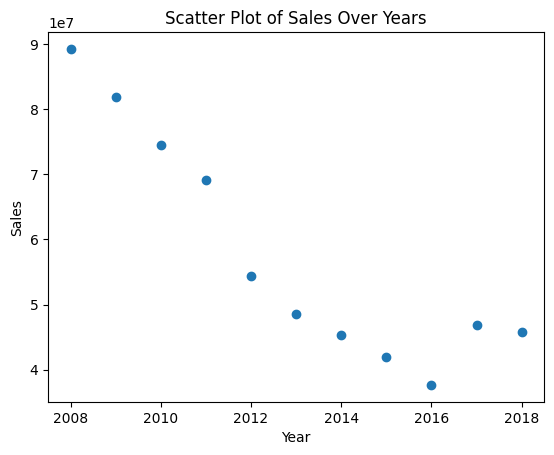

In [31]:
plt.scatter(usa_data['Year'], usa_data['Sales'])

plt.xlabel('Year')
plt.ylabel('Sales')
plt.title('Scatter Plot of Sales Over Years')

plt.show()

In [32]:
# we generate an empty dataframe to store the pearson R coefficient and p values for each variable
correlation_jpn = pd.DataFrame({'Variable': variables , 'Pearson_R':[np.nan for var in variables] , 'p_Value': [np.nan for var in variables]})
correlation_jpn.head()

,Variable,Pearson_R,p_Value
0,Crecimiento del PIB (% anual),NaN,NaN
1,"Desempleo, mujeres (% de la población activa f...",NaN,NaN
2,"Desempleo, total (% de la población activa tot...",NaN,NaN
3,"Desempleo, varones (% de la población activa m...",NaN,NaN
4,"INB per cápita, PPA (a $ internacionales actua...",NaN,NaN


In [33]:
for var in variables:   # itearate throught the variables
    coef, p_value = stats.pearsonr(jpn_data[var], jpn_data['Sales'])    # obtain pearson R and p value
    correlation_jpn.loc[correlation_jpn['Variable'] == var, ['Pearson_R', 'p_Value']] = [coef, p_value]     # save the values on the dataframe
correlation_jpn

,Variable,Pearson_R,p_Value
0,Crecimiento del PIB (% anual),-0.437376,0.178541
1,"Desempleo, mujeres (% de la población activa f...",0.757917,0.006879
2,"Desempleo, total (% de la población activa tot...",0.728954,0.010927
3,"Desempleo, varones (% de la población activa m...",0.706280,0.015127
4,"INB per cápita, PPA (a $ internacionales actua...",-0.922577,0.000052
5,"INB per cápita, método Atlas (US$ a precios ac...",-0.033012,0.923239
6,"INB, PPA (a $ internacionales actuales)",-0.924447,0.000047
7,"INB, método Atlas (US$ a precios actuales)",0.000822,0.998087
8,"Inflación, índice de deflación del PIB (% anual)",-0.667858,0.024718
9,PIB (US$ a precios actuales),0.406613,0.214597


In [34]:
correlation_jpn[correlation_jpn['p_Value']< 0.05]       # get only correlations with p_value < 0.05

,Variable,Pearson_R,p_Value
1,"Desempleo, mujeres (% de la población activa f...",0.757917,0.006879
2,"Desempleo, total (% de la población activa tot...",0.728954,0.010927
3,"Desempleo, varones (% de la población activa m...",0.706280,0.015127
4,"INB per cápita, PPA (a $ internacionales actua...",-0.922577,0.000052
6,"INB, PPA (a $ internacionales actuales)",-0.924447,0.000047
8,"Inflación, índice de deflación del PIB (% anual)",-0.667858,0.024718
10,"Población activa, mujeres (% de la población a...",-0.825922,0.001733
12,"Población de 65 años de edad y más, hombres",-0.922760,0.000052
13,"Población de 65 años de edad y más, mujeres",-0.926468,0.000042
14,"Población de 65 años de edad y más, total",-0.924732,0.000046


In [35]:
correlation_jpn[correlation_jpn['p_Value']< 0.05].sort_values(axis=0, by='Pearson_R')

,Variable,Pearson_R,p_Value
13,"Población de 65 años de edad y más, mujeres",-0.926468,0.000042
14,"Población de 65 años de edad y más, total",-0.924732,0.000046
6,"INB, PPA (a $ internacionales actuales)",-0.924447,0.000047
12,"Población de 65 años de edad y más, hombres",-0.922760,0.000052
4,"INB per cápita, PPA (a $ internacionales actua...",-0.922577,0.000052
10,"Población activa, mujeres (% de la población a...",-0.825922,0.001733
8,"Inflación, índice de deflación del PIB (% anual)",-0.667858,0.024718
3,"Desempleo, varones (% de la población activa m...",0.706280,0.015127
2,"Desempleo, total (% de la población activa tot...",0.728954,0.010927
1,"Desempleo, mujeres (% de la población activa f...",0.757917,0.006879


In [ ]:
# in JPN we have a different pattern of correlation. The console sales are more directly related with the population btw 15 and 64 years.
# the inverse relation with population of > 65 years its similar to USA

In [36]:
# we generate an empty dataframe to store the pearson R coefficient and p values for each variable
correlation_eu = pd.DataFrame({'Variable': variables , 'Pearson_R':[np.nan for var in variables] , 'p_Value': [np.nan for var in variables]})
correlation_eu.head()

,Variable,Pearson_R,p_Value
0,Crecimiento del PIB (% anual),NaN,NaN
1,"Desempleo, mujeres (% de la población activa f...",NaN,NaN
2,"Desempleo, total (% de la población activa tot...",NaN,NaN
3,"Desempleo, varones (% de la población activa m...",NaN,NaN
4,"INB per cápita, PPA (a $ internacionales actua...",NaN,NaN


In [37]:
for var in variables: # itearate throught the variables
    coef, p_value = stats.pearsonr(eu_data[var], eu_data['Sales'])      # obtain pearson R and p value
    correlation_eu.loc[correlation_eu['Variable'] == var, ['Pearson_R', 'p_Value']] = [coef, p_value]       # save the values on the dataframe
correlation_eu

,Variable,Pearson_R,p_Value
0,Crecimiento del PIB (% anual),-0.483105,1.322483e-01
1,"Desempleo, mujeres (% de la población activa f...",-0.259428,4.410873e-01
2,"Desempleo, total (% de la población activa tot...",-0.281308,4.020341e-01
3,"Desempleo, varones (% de la población activa m...",-0.293062,3.817874e-01
4,"INB per cápita, PPA (a $ internacionales actua...",-0.797577,3.271359e-03
5,"INB per cápita, método Atlas (US$ a precios ac...",0.477953,1.370345e-01
6,"INB, PPA (a $ internacionales actuales)",-0.797727,3.261220e-03
7,"INB, método Atlas (US$ a precios actuales)",0.378896,2.504970e-01
8,"Inflación, índice de deflación del PIB (% anual)",0.598634,5.167346e-02
9,PIB (US$ a precios actuales),0.402242,2.200429e-01


In [38]:
correlation_eu[correlation_eu['p_Value'] < 0.05]       # filtering by p_value < 0.05

,Variable,Pearson_R,p_Value
4,"INB per cápita, PPA (a $ internacionales actua...",-0.797577,3.271359e-03
6,"INB, PPA (a $ internacionales actuales)",-0.797727,3.261220e-03
10,"Población activa, mujeres (% de la población a...",-0.978591,1.744885e-07
11,"Población activa, total",-0.820652,1.966236e-03
12,"Población de 65 años de edad y más, hombres",-0.881400,3.352545e-04
13,"Población de 65 años de edad y más, mujeres",-0.870760,4.856622e-04
14,"Población de 65 años de edad y más, total",-0.876148,4.042318e-04
15,"Población entre 0 y 14 años de edad, hombres",0.966406,1.301875e-06
16,"Población entre 0 y 14 años de edad, mujeres",0.980627,1.116177e-07
17,"Población entre 0 y 14 años de edad, total",0.978477,1.786517e-07


In [39]:
correlation_eu[correlation_eu['p_Value'] < 0.05].sort_values(by='Pearson_R')

,Variable,Pearson_R,p_Value
10,"Población activa, mujeres (% de la población a...",-0.978591,1.744885e-07
12,"Población de 65 años de edad y más, hombres",-0.881400,3.352545e-04
14,"Población de 65 años de edad y más, total",-0.876148,4.042318e-04
13,"Población de 65 años de edad y más, mujeres",-0.870760,4.856622e-04
11,"Población activa, total",-0.820652,1.966236e-03
6,"INB, PPA (a $ internacionales actuales)",-0.797727,3.261220e-03
4,"INB per cápita, PPA (a $ internacionales actua...",-0.797577,3.271359e-03
19,"Población entre 15 y 64 años de edad, mujeres",0.857208,7.453138e-04
20,"Población entre 15 y 64 años de edad, total",0.881843,3.298678e-04
18,"Población entre 15 y 64 años de edad, hombres",0.906499,1.193751e-04


In [ ]:
# in the European Union we see a strong direct correlation  between population 0-14 years
# but here we have a new variable in the inverse correlation: 'Active population, woman'

In [40]:
# we generate an empty dataframe to store the pearson R coefficient and p values for each variable
correlation_world = pd.DataFrame({'Variable': variables , 'Pearson_R':[np.nan for var in variables] , 'p_Value': [np.nan for var in variables]})
correlation_world.head()

,Variable,Pearson_R,p_Value
0,Crecimiento del PIB (% anual),NaN,NaN
1,"Desempleo, mujeres (% de la población activa f...",NaN,NaN
2,"Desempleo, total (% de la población activa tot...",NaN,NaN
3,"Desempleo, varones (% de la población activa m...",NaN,NaN
4,"INB per cápita, PPA (a $ internacionales actua...",NaN,NaN


In [41]:
for var in variables:   # itearate throught the variables
    coef, p_value = stats.pearsonr(world_data[var], world_data['Sales'])    # obtain pearson R and p value
    correlation_world.loc[correlation_world['Variable'] == var, ['Pearson_R', 'p_Value']] = [coef, p_value]     # Save values on the dataframe
correlation_world

,Variable,Pearson_R,p_Value
0,Crecimiento del PIB (% anual),-0.416931,0.202059
1,"Desempleo, mujeres (% de la población activa f...",0.089470,0.793628
2,"Desempleo, total (% de la población activa tot...",0.221992,0.511792
3,"Desempleo, varones (% de la población activa m...",0.292223,0.383215
4,"INB per cápita, PPA (a $ internacionales actua...",-0.899454,0.000164
5,"INB per cápita, método Atlas (US$ a precios ac...",-0.919659,0.000062
6,"INB, PPA (a $ internacionales actuales)",-0.891404,0.000229
7,"INB, método Atlas (US$ a precios actuales)",-0.945147,0.000011
8,"Inflación, índice de deflación del PIB (% anual)",0.736639,0.009718
9,PIB (US$ a precios actuales),-0.859285,0.000700


In [42]:
correlation_world[correlation_world['p_Value']< 0.05]       # filtering by p value < 0.05

,Variable,Pearson_R,p_Value
4,"INB per cápita, PPA (a $ internacionales actua...",-0.899454,0.000164
5,"INB per cápita, método Atlas (US$ a precios ac...",-0.919659,0.000062
6,"INB, PPA (a $ internacionales actuales)",-0.891404,0.000229
7,"INB, método Atlas (US$ a precios actuales)",-0.945147,0.000011
8,"Inflación, índice de deflación del PIB (% anual)",0.736639,0.009718
9,PIB (US$ a precios actuales),-0.859285,0.000700
10,"Población activa, mujeres (% de la población a...",0.959423,0.000003
11,"Población activa, total",-0.890605,0.000236
12,"Población de 65 años de edad y más, hombres",-0.838038,0.001276
13,"Población de 65 años de edad y más, mujeres",-0.841095,0.001177


In [43]:
correlation_world[correlation_world['p_Value']< 0.05].sort_values(by='Pearson_R')

,Variable,Pearson_R,p_Value
7,"INB, método Atlas (US$ a precios actuales)",-0.945147,0.000011
5,"INB per cápita, método Atlas (US$ a precios ac...",-0.919659,0.000062
19,"Población entre 15 y 64 años de edad, mujeres",-0.919050,0.000064
20,"Población entre 15 y 64 años de edad, total",-0.917320,0.000070
18,"Población entre 15 y 64 años de edad, hombres",-0.915671,0.000076
4,"INB per cápita, PPA (a $ internacionales actua...",-0.899454,0.000164
15,"Población entre 0 y 14 años de edad, hombres",-0.894730,0.000200
6,"INB, PPA (a $ internacionales actuales)",-0.891404,0.000229
11,"Población activa, total",-0.890605,0.000236
17,"Población entre 0 y 14 años de edad, total",-0.890216,0.000240


In [ ]:
# in the world, we see that economic indicators more important that the ages.
# The strongest inverse correlation is with INB, while the strongest direct relation is with 'Active population, woman'

In [44]:
columns_for_pairplot = variables.copy()
columns_for_pairplot.append('Sales')

In [45]:
print(columns_for_pairplot)

['Crecimiento del PIB (% anual)', 'Desempleo, mujeres (% de la población activa femenina) (estimación modelado OIT)', 'Desempleo, total (% de la población activa total) (estimación modelado OIT)', 'Desempleo, varones (% de la población activa masculina) (estimación modelado OIT)', 'INB per cápita, PPA (a $ internacionales actuales)', 'INB per cápita, método Atlas (US$ a precios actuales)', 'INB, PPA (a $ internacionales actuales)', 'INB, método Atlas (US$ a precios actuales)', 'Inflación, índice de deflación del PIB (% anual)', 'PIB (US$ a precios actuales)', 'Población activa, mujeres (% de la población activa total)', 'Población activa, total', 'Población de 65 años de edad y más, hombres', 'Población de 65 años de edad y más, mujeres', 'Población de 65 años de edad y más, total', 'Población entre 0 y 14 años de edad, hombres', 'Población entre 0 y 14 años de edad, mujeres', 'Población entre 0 y 14 años de edad, total', 'Población entre 15 y 64 años de edad, hombres', 'Población entr

In [ ]:
sns.pairplot(world_data, kind= 'kde')

In [63]:
world_data.columns

Index(['Country Name', 'Year', 'Crecimiento del PIB (% anual)',
       'Desempleo, mujeres (% de la población activa femenina) (estimación modelado OIT)',
       'Desempleo, total (% de la población activa total) (estimación modelado OIT)',
       'Desempleo, varones (% de la población activa masculina) (estimación modelado OIT)',
       'INB per cápita, PPA (a $ internacionales actuales)',
       'INB per cápita, método Atlas (US$ a precios actuales)',
       'INB, PPA (a $ internacionales actuales)',
       'INB, método Atlas (US$ a precios actuales)',
       'Inflación, índice de deflación del PIB (% anual)',
       'PIB (US$ a precios actuales)',
       'Población activa, mujeres (% de la población activa total)',
       'Población de 65 años de edad y más, hombres',
       'Población de 65 años de edad y más, mujeres',
       'Población de 65 años de edad y más, total',
       'Población entre 0 y 14 años de edad, hombres',
       'Población entre 0 y 14 años de edad, mujeres',
  

In [46]:
correlation_variables = ['Sales','Población entre 15 y 64 años de edad, total', 
                         'Población entre 0 y 14 años de edad, total',
                         'Población de 65 años de edad y más, total',
                         'Población activa, mujeres (% de la población activa total)',
                         'Inflación, índice de deflación del PIB (% anual)',
                         'INB, método Atlas (US$ a precios actuales)',
                         'INB per cápita, método Atlas (US$ a precios actuales)',
                         'Desempleo, total (% de la población activa total) (estimación modelado OIT)',
                         'Crecimiento del PIB (% anual)'
                         ]

c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

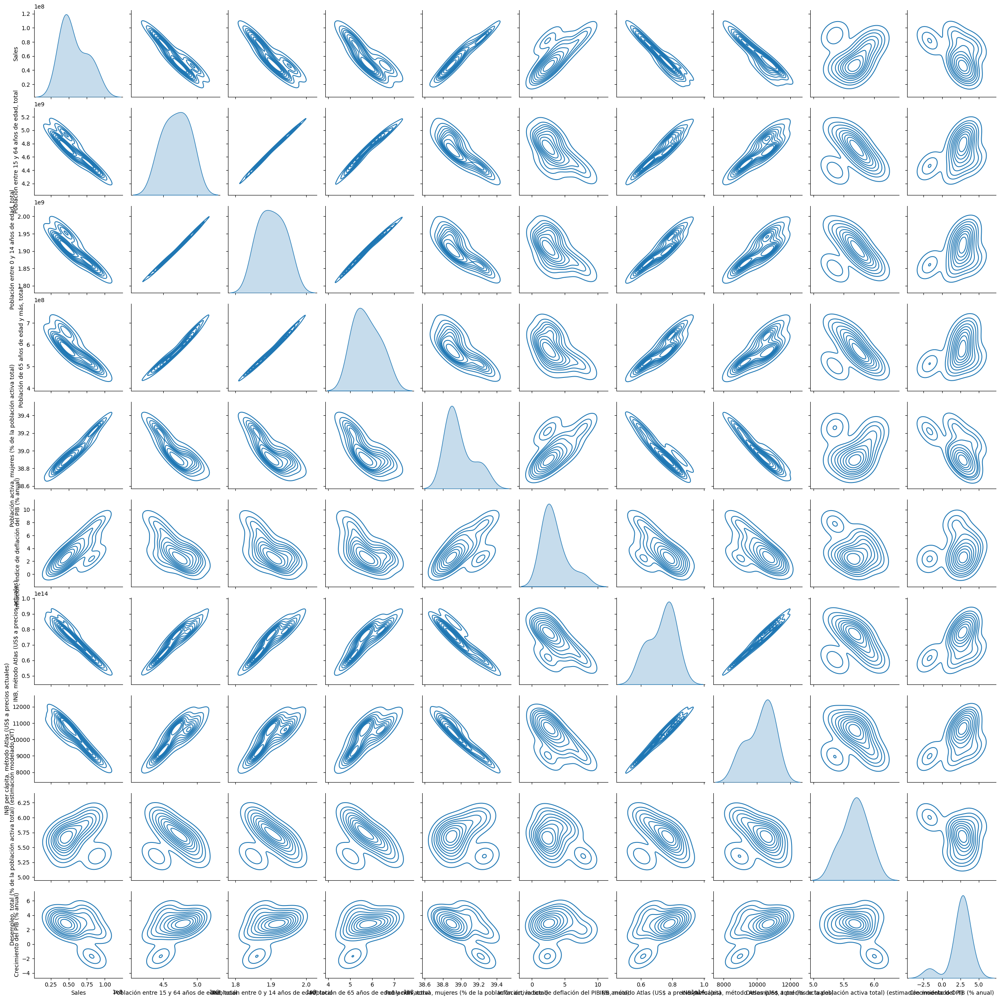

In [47]:
sns.pairplot(world_data[correlation_variables], kind='kde')

c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

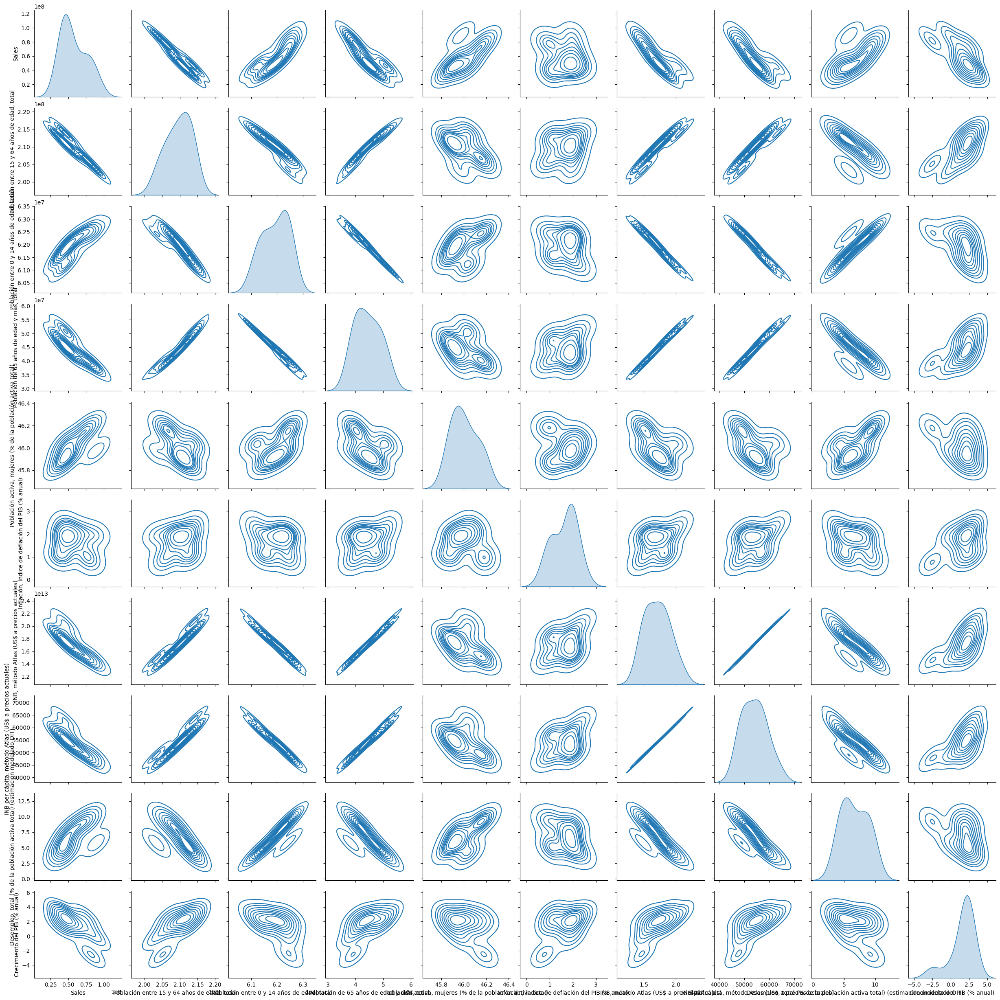

In [48]:
sns.pairplot(usa_data[correlation_variables], kind='kde')

c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

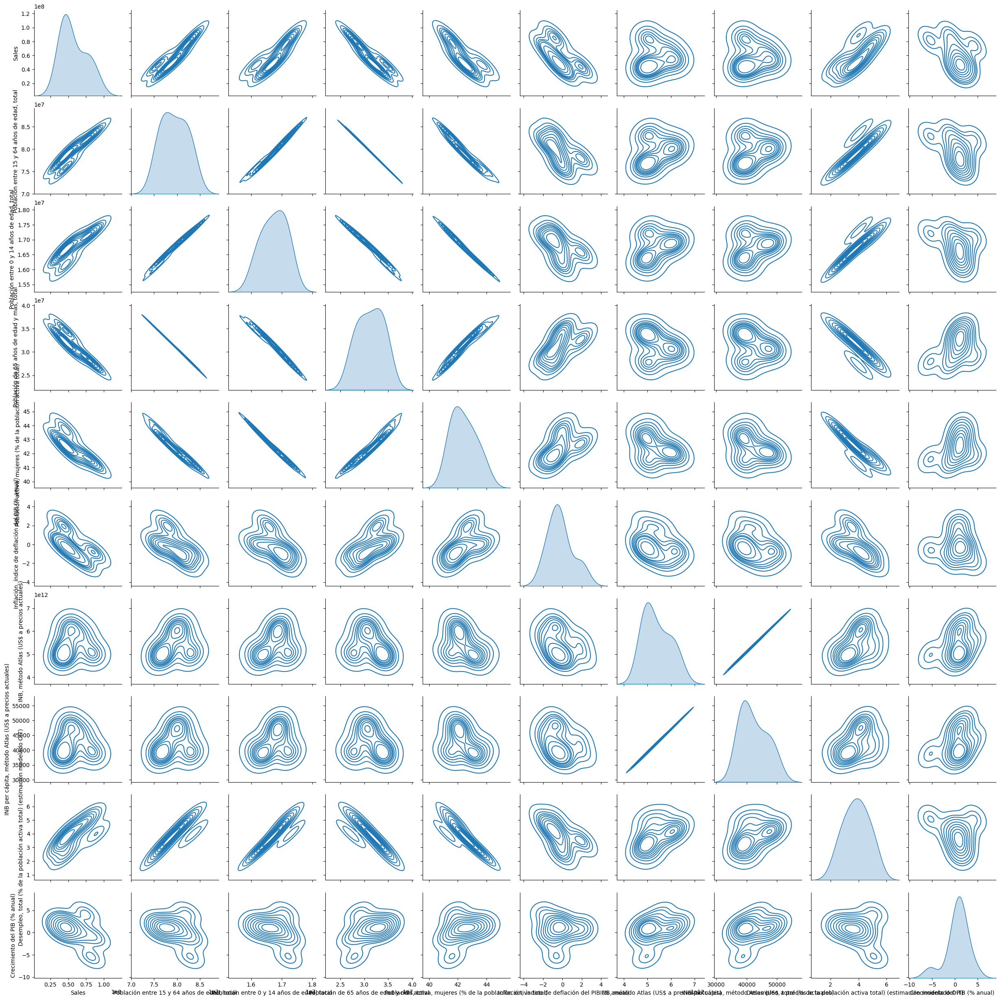

In [49]:
sns.pairplot(jpn_data[correlation_variables], kind='kde')

c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\alter\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

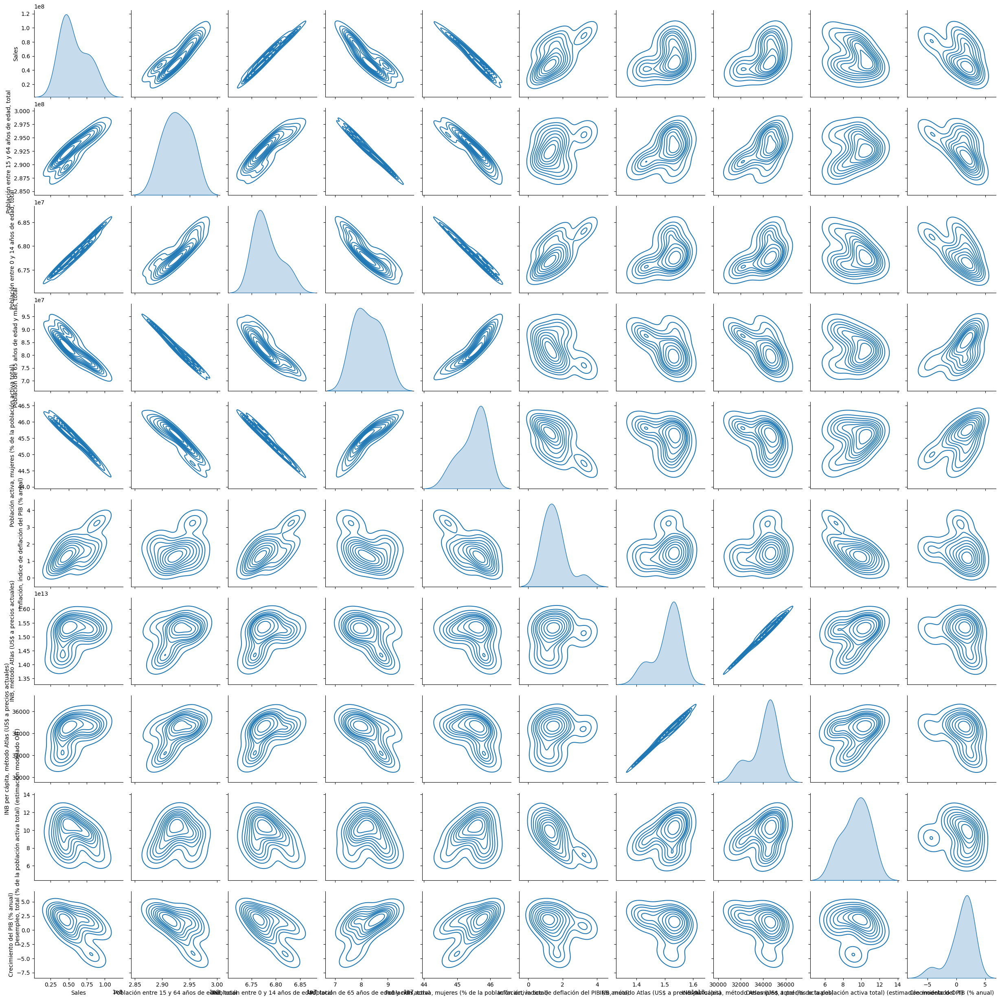

In [50]:
sns.pairplot(eu_data[correlation_variables], kind='kde')

In [ ]:
dict_correlation = {'USA': correlation_usa,
                    'EU': correlation_eu,
                    'JPN': correlation_jpn,
                    'WORLD': correlation_world
}

In [53]:
correlation_usa['Variable'].unique()

array(['Crecimiento del PIB (% anual)',
       'Desempleo, mujeres (% de la población activa femenina) (estimación modelado OIT)',
       'Desempleo, total (% de la población activa total) (estimación modelado OIT)',
       'Desempleo, varones (% de la población activa masculina) (estimación modelado OIT)',
       'INB per cápita, PPA (a $ internacionales actuales)',
       'INB per cápita, método Atlas (US$ a precios actuales)',
       'INB, PPA (a $ internacionales actuales)',
       'INB, método Atlas (US$ a precios actuales)',
       'Inflación, índice de deflación del PIB (% anual)',
       'PIB (US$ a precios actuales)',
       'Población activa, mujeres (% de la población activa total)',
       'Población activa, total',
       'Población de 65 años de edad y más, hombres',
       'Población de 65 años de edad y más, mujeres',
       'Población de 65 años de edad y más, total',
       'Población entre 0 y 14 años de edad, hombres',
       'Población entre 0 y 14 años de edad, mu

In [56]:
variables_edad = ['Población entre 0 y 14 años de edad, hombres',
                  'Población entre 0 y 14 años de edad, mujeres',
                  'Población entre 0 y 14 años de edad, total',
                  'Población entre 15 y 64 años de edad, hombres',
                  'Población entre 15 y 64 años de edad, mujeres',
                  'Población entre 15 y 64 años de edad, total',
                  'Población de 65 años de edad y más, hombres',
                  'Población de 65 años de edad y más, mujeres',
                  'Población de 65 años de edad y más, total'
       ]

In [68]:
correlation_heatmap = pd.merge(correlation_usa[correlation_usa['Variable'].isin(variables_edad)],
                               correlation_jpn[correlation_jpn['Variable'].isin(variables_edad)] , on='Variable')
correlation_heatmap

,Variable,Pearson_R_x,p_Value_x,Pearson_R_y,p_Value_y
0,"Población de 65 años de edad y más, hombres",-0.871412,0.000475,-0.922760,0.000052
1,"Población de 65 años de edad y más, mujeres",-0.867196,0.000546,-0.926468,0.000042
2,"Población de 65 años de edad y más, total",-0.869288,0.000510,-0.924732,0.000046
3,"Población entre 0 y 14 años de edad, hombres",0.837270,0.001302,0.865885,0.000570
4,"Población entre 0 y 14 años de edad, mujeres",0.815860,0.002198,0.865802,0.000571
5,"Población entre 0 y 14 años de edad, total",0.827393,0.001672,0.865848,0.000570
6,"Población entre 15 y 64 años de edad, hombres",-0.946507,0.000010,0.921758,0.000055
7,"Población entre 15 y 64 años de edad, mujeres",-0.950234,0.000007,0.922844,0.000052
8,"Población entre 15 y 64 años de edad, total",-0.948343,0.000009,0.922325,0.000053


In [69]:
correlation_heatmap.rename(columns={'Pearson_R_x': 'USA', 'Pearson_R_y': 'JPN'}, inplace=True)

In [70]:
correlation_heatmap.drop(columns=['p_Value_x', 'p_Value_y'], inplace=True)

In [71]:
correlation_heatmap

,Variable,USA,JPN
0,"Población de 65 años de edad y más, hombres",-0.871412,-0.922760
1,"Población de 65 años de edad y más, mujeres",-0.867196,-0.926468
2,"Población de 65 años de edad y más, total",-0.869288,-0.924732
3,"Población entre 0 y 14 años de edad, hombres",0.837270,0.865885
4,"Población entre 0 y 14 años de edad, mujeres",0.815860,0.865802
5,"Población entre 0 y 14 años de edad, total",0.827393,0.865848
6,"Población entre 15 y 64 años de edad, hombres",-0.946507,0.921758
7,"Población entre 15 y 64 años de edad, mujeres",-0.950234,0.922844
8,"Población entre 15 y 64 años de edad, total",-0.948343,0.922325


In [72]:
correlation_heatmap = pd.merge(correlation_heatmap,correlation_eu[correlation_eu['Variable'].isin(variables_edad)] , on='Variable' )


In [75]:
correlation_heatmap.rename(columns={'Pearson_R': 'EU'}, inplace=True)


In [76]:
correlation_heatmap.drop(columns='p_Value', inplace=True)

In [77]:
correlation_heatmap

,Variable,USA,JPN,EU
0,"Población de 65 años de edad y más, hombres",-0.871412,-0.922760,-0.881400
1,"Población de 65 años de edad y más, mujeres",-0.867196,-0.926468,-0.870760
2,"Población de 65 años de edad y más, total",-0.869288,-0.924732,-0.876148
3,"Población entre 0 y 14 años de edad, hombres",0.837270,0.865885,0.966406
4,"Población entre 0 y 14 años de edad, mujeres",0.815860,0.865802,0.980627
5,"Población entre 0 y 14 años de edad, total",0.827393,0.865848,0.978477
6,"Población entre 15 y 64 años de edad, hombres",-0.946507,0.921758,0.906499
7,"Población entre 15 y 64 años de edad, mujeres",-0.950234,0.922844,0.857208
8,"Población entre 15 y 64 años de edad, total",-0.948343,0.922325,0.881843


In [78]:
correlation_heatmap = pd.merge(correlation_heatmap,correlation_world[correlation_world['Variable'].isin(variables_edad)] , on='Variable' )
correlation_heatmap.rename(columns={'Pearson_R': 'World'}, inplace=True)
correlation_heatmap.drop(columns='p_Value', inplace=True)
correlation_heatmap

,Variable,USA,JPN,EU,World
0,"Población de 65 años de edad y más, hombres",-0.871412,-0.922760,-0.881400,-0.838038
1,"Población de 65 años de edad y más, mujeres",-0.867196,-0.926468,-0.870760,-0.841095
2,"Población de 65 años de edad y más, total",-0.869288,-0.924732,-0.876148,-0.839678
3,"Población entre 0 y 14 años de edad, hombres",0.837270,0.865885,0.966406,-0.894730
4,"Población entre 0 y 14 años de edad, mujeres",0.815860,0.865802,0.980627,-0.885517
5,"Población entre 0 y 14 años de edad, total",0.827393,0.865848,0.978477,-0.890216
6,"Población entre 15 y 64 años de edad, hombres",-0.946507,0.921758,0.906499,-0.915671
7,"Población entre 15 y 64 años de edad, mujeres",-0.950234,0.922844,0.857208,-0.919050
8,"Población entre 15 y 64 años de edad, total",-0.948343,0.922325,0.881843,-0.917320


In [87]:
nuevas_variables = ['65 años o más, hombres',
'65 años o más, mujeres',
'65 años o más, total',
'0 - 14 años, hombres',
'0 - 14 años, mujeres',
'0 - 14 años, total',
'15 - 64 años, hombres',
'15 - 64 años, mujeres',
'15 - 64 años, total']
correlation_heatmap['Variable'] = nuevas_variables
correlation_heatmap

,Variable,USA,JPN,EU,World
0,"65 años o más, hombres",-0.871412,-0.922760,-0.881400,-0.838038
1,"65 años o más, mujeres",-0.867196,-0.926468,-0.870760,-0.841095
2,"65 años o más, total",-0.869288,-0.924732,-0.876148,-0.839678
3,"0 - 14 años, hombres",0.837270,0.865885,0.966406,-0.894730
4,"0 - 14 años, mujeres",0.815860,0.865802,0.980627,-0.885517
5,"0 - 14 años, total",0.827393,0.865848,0.978477,-0.890216
6,"15 - 64 años, hombres",-0.946507,0.921758,0.906499,-0.915671
7,"15 - 64 años, mujeres",-0.950234,0.922844,0.857208,-0.919050
8,"15 - 64 años, total",-0.948343,0.922325,0.881843,-0.917320


In [88]:
correlation_heatmap.sort_values(by='Variable', inplace=True)
correlation_heatmap

,Variable,USA,JPN,EU,World
3,"0 - 14 años, hombres",0.837270,0.865885,0.966406,-0.894730
4,"0 - 14 años, mujeres",0.815860,0.865802,0.980627,-0.885517
5,"0 - 14 años, total",0.827393,0.865848,0.978477,-0.890216
6,"15 - 64 años, hombres",-0.946507,0.921758,0.906499,-0.915671
7,"15 - 64 años, mujeres",-0.950234,0.922844,0.857208,-0.919050
8,"15 - 64 años, total",-0.948343,0.922325,0.881843,-0.917320
0,"65 años o más, hombres",-0.871412,-0.922760,-0.881400,-0.838038
1,"65 años o más, mujeres",-0.867196,-0.926468,-0.870760,-0.841095
2,"65 años o más, total",-0.869288,-0.924732,-0.876148,-0.839678


In [ ]:
correlation_heatmap.set_index('Variable', inplace=True)

Text(0.5, 1.0, 'Mapa de calor de correlación \n Ventas de Consolas')

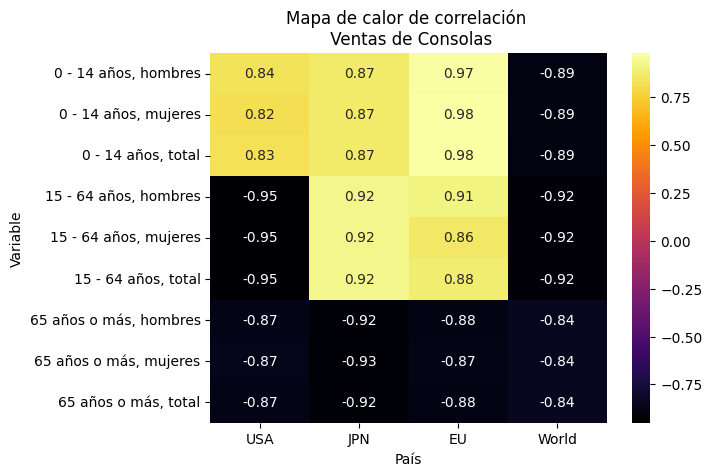

In [108]:
sns.heatmap(correlation_heatmap[['USA', 'JPN', 'EU', 'World']], annot=True, cmap='inferno', fmt=".2f")

plt.xlabel('País')
plt.ylabel('Variable')
plt.title('Mapa de calor de correlación \n Ventas de Consolas')